In [23]:
import pandas as pd
import numpy as np
import ast
import re
import dtale
from sklearn.preprocessing import MinMaxScaler
import seaborn as sns
import matplotlib.pyplot as plt

In [7]:
# Универсальная функция для проверки наличия целевого слова и группировки комментариев в DataFrame
def check_for_word_and_group(target_word, group_name, df, column_name):
    # Список для сохранения комментариев, которые попали в соответствующую группу
    grouped_comments = []

    # Внутренняя функция для применения к каждому комментарию
    def check_comment(comment):
        words = comment.split()  # Разбиваем комментарий на отдельные слова
        for word in words:
            if re.search(target_word, word, re.IGNORECASE):  # Проверяем каждое слово на наличие целевого слова
                grouped_comments.append(comment)  # Добавляем комментарий в список для анализа
                return group_name  # Если найдено целевое слово, относим комментарий в соответствующую категорию
        return comment  # Если целевое слово не найдено, возвращаем исходный комментарий

    # Применяем функцию к указанному столбцу DataFrame
    df[column_name] = df[column_name].apply(check_comment)

    # Возвращаем обновлённый DataFrame и список отобранных комментариев
    return df, grouped_comments

# # Пример использования для поиска слова "small" и группировки в категорию "small_room"
# hotels, small_room_comments = check_for_word_and_group('small', 'small_room', hotels, 'negative_review')

# # Пример использования для поиска слова "expensive" и группировки в категорию "expensive"
# hotels, expensive_comments = check_for_word_and_group('expensive', 'expensive', hotels, 'negative_review')

# # Пример использования для поиска слова "wifi" и группировки в категорию "wifi"
# hotels, wifi_comments = check_for_word_and_group('wifi', 'wifi', hotels, 'negative_review')

def check_for_phrase_and_group(target_phrase, group_name, df, column_name):
    # Список для сохранения комментариев, которые попали в соответствующую группу
    grouped_comments = []

    # Внутренняя функция для применения к каждому комментарию
    def check_comment(comment):
        if re.search(target_phrase, comment, re.IGNORECASE):  # Проверяем наличие целевой фразы в комментарии
            grouped_comments.append(comment)  # Добавляем комментарий в список для анализа
            return group_name  # Если найдена целевая фраза, относим комментарий в соответствующую категорию
        return comment  # Если фраза не найдена, возвращаем исходный комментарий

    # Применяем функцию к указанному столбцу DataFrame
    df[column_name] = df[column_name].apply(check_comment)

    # Возвращаем обновлённый DataFrame и список отобранных комментариев
    return df, grouped_comments

# # Пример использования для поиска фразы "no restaurant" и группировки в категорию "facilities"
# hotels, facil_comments2 = check_for_word_and_group('no restaurant', 'facilities', hotels, 'negative_review')

# # Пример использования для поиска фразы "no gym" и группировки в категорию "facilities"
# hotels, facil_comments3 = check_for_word_and_group('no gym', 'facilities', hotels, 'negative_review')

# # Проверяем результат
# print(hotels['negative_review'].value_counts().head(50))

# # Выводим отобранные комментарии для каждой группы
# print("Отобранные комментарии для 'facilities (no restaurant)':", facil_comments2)
# print("Отобранные комментарии для 'facilities (no gym)':", facil_comments3)


# Универсальная функция для проверки наличия массива фраз и группировки комментариев в DataFrame
def check_for_phrases_and_group(target_phrases, group_name, df, column_name):
    # Список для сохранения комментариев, которые попали в соответствующую группу
    grouped_comments = []

    # Внутренняя функция для применения к каждому комментарию
    def check_comment(comment):
        for phrase in target_phrases:  # Проверяем каждую фразу из массива
            if re.search(phrase, comment, re.IGNORECASE):  # Проверяем наличие фразы в комментарии
                grouped_comments.append(comment)  # Добавляем комментарий в список для анализа
                return group_name  # Если найдена фраза, относим комментарий в соответствующую категорию
        return comment  # Если ни одна фраза не найдена, возвращаем исходный комментарий

    # Применяем функцию к указанному столбцу DataFrame
    df[column_name] = df[column_name].apply(check_comment)

    # Возвращаем обновлённый DataFrame и список отобранных комментариев
    return df, grouped_comments

# Пример использования для поиска фраз ["no restaurant", "no gym"] и группировки в категорию "facilities"
# facilities_phrases = ['no restaurant', 'no gym', 'no pool', 'no bar']
# hotels, facilities_comments = check_for_phrases_and_group(facilities_phrases, 'facilities', hotels, 'negative_review')

# # Пример использования для поиска фраз ["poor wifi", "no wifi"] и группировки в категорию "wifi"
# wifi_phrases = ['poor wifi', 'no wifi', 'slow wifi']
# hotels, wifi_comments2 = check_for_phrases_and_group(wifi_phrases, 'wifi', hotels, 'negative_review')

In [419]:
hotels = pd.read_csv('./data/hotels.csv')
hotels.head(3)

,hotel_address,additional_number_of_scoring,review_date,average_score,hotel_name,reviewer_nationality,negative_review,review_total_negative_word_counts,total_number_of_reviews,positive_review,review_total_positive_word_counts,total_number_of_reviews_reviewer_has_given,reviewer_score,tags,days_since_review,lat,lng
0,Stratton Street Mayfair Westminster Borough Lo...,581,2/19/2016,8.4,The May Fair Hotel,United Kingdom,Leaving,3,1994,Staff were amazing,4,7,10.0,"[' Leisure trip ', ' Couple ', ' Studio Suite ...",531 day,51.507894,-0.143671
1,130 134 Southampton Row Camden London WC1B 5AF...,299,1/12/2017,8.3,Mercure London Bloomsbury Hotel,United Kingdom,poor breakfast,3,1361,location,2,14,6.3,"[' Business trip ', ' Couple ', ' Standard Dou...",203 day,51.521009,-0.123097
2,151 bis Rue de Rennes 6th arr 75006 Paris France,32,10/18/2016,8.9,Legend Saint Germain by Elegancia,China,No kettle in room,6,406,No Positive,0,14,7.5,"[' Leisure trip ', ' Solo traveler ', ' Modern...",289 day,48.845377,2.325643


Когда был оставлен самый свежий отзыв? Введите ответ в формате yyyy-mm-dd.


Когда был оставлен самый первый отзыв? Введите ответ в формате yyyy-mm-dd.

In [420]:
# convert review date to datetime format
hotels['review_date'] =  pd.to_datetime(hotels['review_date'])
print('min date ' ,hotels['review_date'].min())
print('max date ' ,hotels['review_date'].max())

min date  2015-08-04 00:00:00
max date  2017-08-03 00:00:00


** Сколько уникальных тегов представлено в наборе данных?**

In [421]:
# Инициализируем пустое множество для хранения уникальных тегов
unique_tags = set()
for tags in hotels['tags']:
  tag_list = ast.literal_eval(tags)
  unique_tags.update(tag_list)
#  Подсчитываем количество уникальных тегов
unique_tags_count = len(unique_tags)
unique_tags_count

2368

Какой тег представлен в наибольшем числе отзывов?


In [422]:
tag_count = {}

for tags in hotels['tags']:
  tag_list = ast.literal_eval(tags)
  
  for tag in tag_list:
    if tag in tag_count:
      tag_count[tag] +=1
    else:
      tag_count[tag] = 1
most_common_tag = max(tag_count, key=tag_count.get)
most_common_tag     

' Leisure trip '

Из тегов выясните, на сколько ночей чаще всего останавливаются путешественники в отелях.


In [423]:
nights_count = {}
# Регулярное выражение для поиска количества ночей, например "2 nights", "5 nights"
nights_pattern = re.compile(r'(\d+)\s+nights?')

for tags in hotels['tags']:
  tag_list = ast.literal_eval(tags)
  
  for tag in tag_list:
    match = nights_pattern.search(tag)
    if match:
      nights = int(match.group(1))  # Извлекаем количество ночей из совпадения
      if nights in nights_count:
        nights_count[nights] +=1
      else:
        nights_count[nights] =1
most_common_nights = max(nights_count, key=nights_count.get)     
print(most_common_nights)


1


## Строковые данные

В исходном наборе данных всего девять столбцов содержат числовые данные. Так что просто удалить все object-значения и считать задачу выполненной не получится. Мы сделали это в прошлом юните, чтобы получить значение метрики. Но чтобы улучшить качество модели, вам перед удалением придётся очень основательно поработать со строковыми данными и извлечь из них как можно больше информации, которую можно представить в числовом виде.

In [424]:
print(hotels.dtypes)

hotel_address                                         object
additional_number_of_scoring                           int64
review_date                                   datetime64[ns]
average_score                                        float64
hotel_name                                            object
reviewer_nationality                                  object
negative_review                                       object
review_total_negative_word_counts                      int64
total_number_of_reviews                                int64
positive_review                                       object
review_total_positive_word_counts                      int64
total_number_of_reviews_reviewer_has_given             int64
reviewer_score                                       float64
tags                                                  object
days_since_review                                     object
lat                                                  float64
lng                     

для начала сделаем быстрый автоматический анализ данных с помощью dtale

In [425]:
d = dtale.show(hotels)
d

In [426]:
# попробуем извлечь страну из столбца адрес
# Функция для извлечения страны из адреса
def extract_country(address):
    # Ищем последние одно или два слова в строке после последнего почтового индекса или числа в скобках
    country_search = re.search(r'\b([A-Za-z\s]+)\b(?:\s*\(\d+\))?$', address)
    if country_search:
        return country_search.group(1).strip()  # Возвращаем страну, убрав лишние пробелы
    return None

hotels['country'] = hotels['hotel_address'].apply(extract_country)
d = dtale.show(hotels)
d




неплохо - но не совсем то что нужно. Хорошая новость в том что мы теперь более или менее понимае список возмолжных стран. на основе этого учтоним нашу функцию по поиску странц и города


In [427]:
countries = [
    "United Kingdom", "Spain", "France", "Austria", "Italy", 
    "Netherlands", "Germany", "Belgium", "Switzerland", "Portugal"
]
def extract_country(address):
    # Регулярное выражение ищет последние слова, которые являются страной
    country_search = re.search(r'(' + '|'.join(countries) + r')$', address)
    if country_search:
        return country_search.group(1)
    return None

# Применяем функцию к столбцу с адресами
hotels['country'] = hotels['hotel_address'].apply(extract_country)

hotels['country'].value_counts()


United Kingdom    196774
Spain              45132
France             44830
Netherlands        43006
Austria            29178
Italy              27883
Name: country, dtype: int64

**отлично на данном этапе мы имеем 6 стран попробуем выделить города перед удалением столбца с адресом**

In [428]:
cities = [
    "London", "Paris", "Amsterdam", "Milan", "Barcelona", "Vienna", 
]
def extract_city(address):
    # Ищем город перед почтовым индексом или страной
    city_search = re.search(r'(' + '|'.join(cities) + r')\b', address)
    if city_search:
        return city_search.group(1)
    else:
        return "Unknown"  # Возвращаем "Unknown", если город не найден

# Применяем функцию к столбцу с адресами
hotels['city'] = hotels['hotel_address'].apply(extract_city)

# Выведем первые несколько значений для проверки
hotels[['hotel_address', 'city']].head()



,hotel_address,city
0,Stratton Street Mayfair Westminster Borough Lo...,London
1,130 134 Southampton Row Camden London WC1B 5AF...,London
2,151 bis Rue de Rennes 6th arr 75006 Paris France,Paris
3,216 Avenue Jean Jaures 19th arr 75019 Paris Fr...,Paris
4,Molenwerf 1 1014 AG Amsterdam Netherlands,Amsterdam


In [429]:
d = dtale.show(hotels)
d
# проверяем есть ли unknown среди горордов - нет - значит все нормально я думаю можно удалять графу с адресом
hotels.drop(columns=['hotel_address'], axis=1, inplace=True)
# по идее столбец со странами нам тоже не нужен так в каждой стране находится по одному городу и город это более точное определение в пространстве нежели страна так что - что бы не кодировать лишние столбцы уберем страну из таблицы
hotels.drop(columns=['country'], axis=1, inplace=True)

следующий на очереди столбец с датой обзора - возьмем из нее только год и месяц. возможно что в сезонность как то влияет на отзыв - проверим



In [430]:
# Извлечение года
hotels['review_year'] = hotels['review_date'].dt.year

# Извлечение месяца
hotels['review_month'] = hotels['review_date'].dt.month

# удалим исходный столбец
hotels.drop(columns=['review_date'], axis=1, inplace=True)



In [431]:
hotels['hotel_name'].value_counts()
# тут у нас почти 1500 значений - предлагаю удалить его
hotels.drop(columns=['hotel_name'], axis=1, inplace=True)


In [432]:
# reviewer_nationality
top_n = 10;
top_reviewer_nationality = hotels['reviewer_nationality'].value_counts().index[:top_n]
hotels['reviewer_nationality'] = hotels['reviewer_nationality'].apply(lambda x: x if x in top_reviewer_nationality else 'other')
hotels['reviewer_nationality'].value_counts()

 United Kingdom               184033
other                         109479
 United States of America      26541
 Australia                     16239
 Ireland                       11126
 United Arab Emirates           7617
 Saudi Arabia                   6722
 Netherlands                    6608
 Switzerland                    6498
 Canada                         5984
 Germany                        5956
Name: reviewer_nationality, dtype: int64

In [433]:
# negative_review
# Приводим все строки к нижнему регистру для унификации значений
hotels['negative_review'] = hotels['negative_review'].str.lower().str.strip()
# Проверяем первые несколько строк для уверенности, что всё преобразовано корректно

# Проверка списка значений для замены
no_negative_values_to_replace = [
    "no negative", "nothing", "n a", "none", "na", "", " ", 'having to leave',
    "there was nothing i didn t like", "nothing really", "nothing in particular",
    "everything was fine", "i liked everything", "no thing", "nothing not to like",
    "absolutely nothing", "all was good", "everything was good", "non", "not much",
    "everything was great", "nothing not to like", "liked everything", "nothing to complain about",
    "everything was perfect", "nothing to dislike", "no complaints", "all good", 
    "nothing at all", "nil", "nothing it was perfect", "nothing everything was perfect","nothing all good","nothing everything was great","nothing comes to mind", "nothing to report","no complaints at all","nothing could have been better","liked it all","nothing we didn t like","nothing special","nothing bad","everything was ok","there was nothing not to like","nothing bad to say","no bad experience","no issues","nothing to complain","nothing to say","nothing i can think of","no problems","nothing bad","liked it all","nothing to report","no negatives","it was all good","there was nothing to dislike","nothing i didn t like","there was nothing we didn t like","nothing to mention","we liked everything","no dislikes","loved everything","all ok","nothing to not like" ,"all great","that we had to leave","all ok","nothing much","i loved everything","there wasn t anything we didn t like","no","everything was excellent","all was great","nothing all was great","i have no complaints","nothing to fault","nothing to add","all was perfect","nothing negative to say","going home","nothing it was great","it was perfect","no bad experiences","not a lot","nothing all was good","nothing it was all good","loved it all","value for money","everything was very good"," nothing all great","nothing everything was excellent"
]
# Заменяем все значения на 'no negative'
hotels['negative_review'] = hotels['negative_review'].replace(no_negative_values_to_replace, "no negative")


expansive_values_to_replace = [
    'expensive', 'too expensive', 'overpriced', 'cost', 'price', 
        'the price', 'a bit expensive', 'bar prices', 'cost of breakfast', 
        'very expensive', 'expensive breakfast', 'breakfast was expensive', 
        'price of breakfast', 'breakfast too expensive',"breakfast expensive","quite expensive","a little expensive","a bit pricey","expensive parking","breakfast very expensive"
]

hotels['negative_review'] = hotels['negative_review'].replace(expansive_values_to_replace, "expensive")

small_room_values_to_replace = [
    'small room', 'small rooms', 'room was small', 'room too small', "room is small","rooms","room small"
        'very small room', 'tiny room', 'room size', 'size of room', "the room","room was quite small","rooms a bit small",
        'room a bit small', 'room was a bit small', 'the room was very small', 
        'the room was small', 'room very small', 'rooms are very small', "room", 
        'size of the room', 'the size of the room', 'rooms are small', "room was tiny",
        'room was a little small', 'room a little small', 'rooms very small','room was very small',"very small rooms","room was too small","room is too small","the room was too small","the room was a bit small","rooms too small","the rooms are very small"," rooms are too small","the room is too small","the room is very small"
]
breakfast_values_to_replace = [
    'breakfast could be better',"the breakfast","breakfast not included","poor breakfast"," poor breakfas","breakfast could have been better","food","breakfast was poor","the food","no breakfast included"
]
hotels['negative_review'] = hotels['negative_review'].replace(breakfast_values_to_replace, "breakfast")

hotels['negative_review'] = hotels['negative_review'].replace(small_room_values_to_replace, "small_room")





In [434]:
# переходим к регуляркам
# Expensive
# hotels['negative_review'] = hotels['negative_review'].replace(
#     to_replace=r'(expensive|too expensive|overpriced|cost|price|cost too much|pricey|breakfast too expensive|expensive breakfast)', 
#     value='expensive', regex=True)

# # Small Room
# hotels['negative_review'] = hotels['negative_review'].replace(
#     to_replace=r'(small room|tiny room|room too small|very small room|the room was too small|cramped|room size|room a bit small|room was small|size of the room|the room was very small)', 
#     value='small room', regex=True)

# # Breakfast
# hotels['negative_review'] = hotels['negative_review'].replace(
#     to_replace=r'(poor breakfast|breakfast not included|breakfast could be better|breakfast was bad|breakfast was poor|no breakfast included|the breakfast|breakfast could have been better)', 
#     value='breakfast', regex=True)

# Expensive: если в отзыве есть упоминание слова, связанного с высокой ценой
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'(expensive|overpriced|cost|pricey|cost too much|too expensive)', 
    value='expensive', regex=True)

# Small Room: если в отзыве есть упоминание "room/rooms" + "small/little/tiny"
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'(room|rooms)\s*(small|little|tiny)', 
    value='small_room', regex=True)

# Breakfast: если есть упоминание о завтраке, исключая его цену
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'(breakfast)(?!.*(expensive|pricey|cost|too expensive))', 
    value='breakfast', regex=True)

In [435]:

# Проверяем результат замены
print(hotels['negative_review'].value_counts().head(50))


no negative                121994
small_room                   2445
expensive                    1291
breakfast                     828
location                      393
everything                    330
can t think of anything       180
leaving                       178
very small room               167
staff                         132
see above                     104
parking                        90
pillows                        88
not applicable                 81
wifi                           81
no parking                     75
no gym                         74
as above                       73
not a thing                    69
bathroom                       68
no free wifi                   66
small bathroom                 64
the weather                    63
noise                          57
bed                            56
no swimming pool               55
the location                   54
no bar                         54
no comment                     50
the bed       

In [436]:
# доработка
# Применение новых регулярных выражений

# Small Room: с использованием small_room
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'((very|quite|a bit|a little|too)?\s*(small|little|tiny)\s*(room|rooms|bathroom))', 
    value='small_room', regex=True)

# Expensive: с использованием группы expensive
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'(is|was|were|be)?\s*(expensive|overpriced|cost|pricey|cost too much|too expensive)', 
    value='expensive', regex=True)
# Проверяем результат
print(hotels['negative_review'].value_counts().head(50))


no negative                121994
small_room                   2759
expensive                    1297
breakfast                     828
location                      393
everything                    330
can t think of anything       180
leaving                       178
staff                         132
see above                     104
parking                        90
pillows                        88
breakfast expensive            88
wifi                           81
not applicable                 81
no parking                     75
no gym                         74
as above                       73
not a thing                    69
bathroom                       68
no free wifi                   66
the weather                    63
noise                          57
bed                            56
no swimming pool               55
the location                   54
no bar                         54
no comment                     50
small_rooms                    50
the bed       

In [437]:
# Expensive: с использованием группы expensive (с пробелами для избежания слияния слов)
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(is|was|were|be)?\s*(expensive|overpriced|cost|pricey|cost too much|too expensive)\b', 
    value='expensive', regex=True)

# Small Room: с использованием small_room (с пробелами для избежания слияния слов)
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b((very|quite|a bit|a little|too)?\s*(small|little|tiny)\s*(room|rooms|bathroom))\b', 
    value='small_room', regex=True)
# Wi-Fi: жалобы на интернет или Wi-Fi
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(wifi|wi-fi|internet|no wifi|slow wifi|poor wifi|bad internet)\b', 
    value='wifi', regex=True)
# Парковка: жалобы на парковку
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(parking|no parking|expensive parking|bad parking)\b', 
    value='parking', regex=True)
# Удобства: жалобы на отсутствие или качество удобств (бассейн, тренажёрный зал и т.д.)
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(gym|pool|bar|no gym|no pool|no bar|no swimming pool)\b', 
    value='facilities', regex=True)
# Шум: жалобы на шум
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(noisy|too noisy|loud)\b', 
    value='noise', regex=True)
# Проверим результат замены
print(hotels['negative_review'].value_counts().head(50))


no negative                121994
small_room                   2759
expensive                    1297
breakfast                     828
location                      393
everything                    330
facilities                    292
wifi                          185
can t think of anything       180
leaving                       178
parking                       168
staff                         132
noise                         109
see above                     104
breakfastexpensive            103
pillows                        88
not applicable                 81
no free wifi                   73
as above                       73
not a thing                    69
bathroom                       68
the weather                    63
bed                            56
the location                   54
small_rooms                    50
no comment                     50
the bed                        49
wifi connection                45
parkingexpensive               45
nada          

======================================================================================================================================

In [438]:
# Expensive: исправляем объединение слов (bitexpensive, a littleexpensive)
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(is|was|were|be)?\s*(expensive|overpriced|cost|pricey|cost too much|too expensive|bit expensive|a little expensive|a bit expensive)\b', 
    value='expensive', regex=True)

# Small Room: добавляем фразы вроде "rooms a little small", исправляем "small_rooms"
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b((very|quite|a bit|a little|too)?\s*(small|little|tiny)\s*(room|rooms))\b', 
    value='small_room', regex=True)

# Парковка: обрабатываем фразы, такие как "paying for parking"
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(parking|no parking|expensive parking|bad parking|paying for parking)\b', 
    value='parking', regex=True)

# Завтрак: добавляем фразы вроде "no breakfast"
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(no breakfast|breakfast was not included)\b', 
    value='breakfast', regex=True)

# Положительные отзывы: обработка фраз, таких как "nothing all great", и добавление в группу "no negative"
hotels['negative_review'] = hotels['negative_review'].replace(
    to_replace=r'\b(nothing all great|everything was great|it was all great)\b', 
    value='no negative', regex=True)

# Проверим результат замены
print(hotels['negative_review'].value_counts().head(50))



no negative                122035
small_room                   2759
expensive                    1297
breakfast                     865
location                      393
everything                    330
facilities                    292
parking                       190
wifi                          185
can t think of anything       180
leaving                       178
staff                         132
noise                         109
see above                     104
breakfastexpensive            103
pillows                        88
not applicable                 81
as above                       73
no free wifi                   73
not a thing                    69
bathroom                       68
the weather                    63
bed                            56
the location                   54
no comment                     50
small_rooms                    50
the bed                        49
parkingexpensive               45
wifi connection                45
nada          

In [439]:
# Список для сохранения комментариев, которые попали в группу small_room
small_room_comments = []

# Функция для проверки, содержит ли комментарий слово с "small"
def check_for_small(comment):
    words = comment.split()  # Разбиваем комментарий на отдельные слова
    for word in words:
        if re.search(r'small', word, re.IGNORECASE):  # Проверяем каждое слово на наличие "small"
            small_room_comments.append(comment)  # Добавляем комментарий в список для анализа
            return 'small_room'  # Если найдено слово с "small", относим комментарий в категорию small_room
    return comment  # Если "small" не найден, возвращаем исходный комментарий

# Применяем функцию к столбцу negative_review
hotels['negative_review'] = hotels['negative_review'].apply(check_for_small)

# Проверяем результат
print(hotels['negative_review'].value_counts().head(50))

# Выводим отобранные комментарии, которые попали в категорию small_room
print("Отобранные комментарии для small_room:")
for comment in small_room_comments:
    print(comment)
    

no negative                 122035
small_room                   37891
expensive                     1297
breakfast                      865
location                       393
everything                     330
facilities                     292
parking                        190
wifi                           185
can t think of anything        180
leaving                        178
staff                          132
noise                          109
see above                      104
breakfastexpensive             103
pillows                         88
not applicable                  81
no free wifi                    73
as above                        73
not a thing                     69
bathroom                        68
the weather                     63
bed                             56
the location                    54
no comment                      50
the bed                         49
parkingexpensive                45
wifi connection                 45
nada                

In [440]:
# Список для сохранения комментариев, которые попали в группу expensive
expensive_comments = []

# Функция для проверки, содержит ли комментарий слово с "expensive"
def check_for_expensive(comment):
    words = comment.split()  # Разбиваем комментарий на отдельные слова
    for word in words:
        if re.search(r'expensive', word, re.IGNORECASE):  # Проверяем каждое слово на наличие "expensive"
            expensive_comments.append(comment)  # Добавляем комментарий в список для анализа
            return 'expensive'  # Если найдено слово с "expensive", относим комментарий в категорию expensive
    return comment  # Если "expensive" не найден, возвращаем исходный комментарий

# Применяем функцию к столбцу negative_review
hotels['negative_review'] = hotels['negative_review'].apply(check_for_expensive)

# Проверяем результат
print(hotels['negative_review'].value_counts().head(50))

# Выводим отобранные комментарии, которые попали в категорию expensive
print("Отобранные комментарии для expensive:")
for comment in expensive_comments:
    print(comment)


no negative                     122035
small_room                       37891
expensive                        16907
breakfast                          865
location                           393
everything                         330
facilities                         292
parking                            190
wifi                               185
can t think of anything            180
leaving                            178
staff                              132
noise                              109
see above                          104
pillows                             88
not applicable                      81
as above                            73
no free wifi                        73
not a thing                         69
bathroom                            68
the weather                         63
bed                                 56
the location                        54
no comment                          50
the bed                             49
wifi connection          

In [441]:
hotels, wifi_comments = check_for_word_and_group('wi fi', 'wifi', hotels, 'negative_review')
hotels, wifi_comments1 = check_for_word_and_group('wi-fi', 'wifi', hotels, 'negative_review')
hotels, wifi_comments2 = check_for_word_and_group('internet', 'wifi', hotels, 'negative_review')
hotels, wifi_comments2 = check_for_word_and_group('wifi', 'wifi', hotels, 'negative_review')
hotels, wifi_comments2 = check_for_word_and_group('connection', 'wifi', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))



no negative                     122035
small_room                       37891
expensive                        16907
wifi                              9698
breakfast                          865
location                           393
everything                         330
facilities                         292
parking                            190
can t think of anything            180
leaving                            178
staff                              132
noise                              109
see above                          104
pillows                             88
not applicable                      81
as above                            73
not a thing                         69
bathroom                            68
the weather                         63
bed                                 56
the location                        54
no comment                          50
the bed                             49
nada                                43
the view                 

In [442]:
hotels, facil_comments1 = check_for_word_and_group('parking', 'facilities', hotels, 'negative_review')
hotels, facil_comments2 = check_for_word_and_group('bathroom', 'facilities', hotels, 'negative_review')
hotels, facil_comments3 = check_for_word_and_group('bed', 'facilities', hotels, 'negative_review')
hotels, facil_comments4 = check_for_word_and_group('conditioning', 'facilities', hotels, 'negative_review')
hotels, facil_comments5 = check_for_word_and_group('lift', 'facilities', hotels, 'negative_review')
hotels, facil_comments6 = check_for_word_and_group('bath', 'facilities', hotels, 'negative_review')
hotels, facil_comments7 = check_for_word_and_group('shower', 'facilities', hotels, 'negative_review')
hotels, facil_comments8 = check_for_word_and_group('fridge', 'facilities', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
expensive                        16907
wifi                              9698
breakfast                          865
location                           393
everything                         330
can t think of anything            180
leaving                            178
staff                              132
noise                              109
see above                          104
pillows                             88
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
the location                        54
no comment                          50
nada                                43
the view                            42
cleanliness                         41
everything else                     39
room service                        38
service                  

In [443]:
hotels, service_comments = check_for_word_and_group('service', 'service', hotels, 'negative_review')
hotels, service_comments = check_for_word_and_group('staff', 'service', hotels, 'negative_review')
hotels, service_comments = check_for_word_and_group('housekeeping', 'service', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
service                          23779
expensive                        16907
wifi                              9698
breakfast                          865
location                           393
everything                         330
can t think of anything            180
leaving                            178
noise                              109
see above                          104
pillows                             88
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
the location                        54
no comment                          50
nada                                43
the view                            42
cleanliness                         41
everything else                     39
view                                37
every thing              

In [444]:


hotels, service_comments = check_for_word_and_group('view', 'View', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
service                          23779
expensive                        16907
wifi                              9698
View                              3710
breakfast                          865
location                           393
everything                         330
can t think of anything            180
leaving                            178
noise                              109
see above                          104
pillows                             88
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
the location                        54
no comment                          50
nada                                43
cleanliness                         41
everything else                     39
every thing                         37
no comments              

In [445]:

hotels, noise_comments = check_for_word_and_group('noise', 'Noise', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
service                          23779
expensive                        16907
Noise                            10241
wifi                              9698
View                              3710
breakfast                          865
location                           393
everything                         330
can t think of anything            180
leaving                            178
see above                          104
pillows                             88
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
the location                        54
no comment                          50
nada                                43
cleanliness                         41
everything else                     39
every thing                         37
the pillows              

In [446]:
hotels, location_comments = check_for_word_and_group('location', 'Location', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
service                          23779
expensive                        16907
Noise                            10241
wifi                              9698
Location                          4160
View                              3710
breakfast                          865
everything                         330
can t think of anything            180
leaving                            178
see above                          104
pillows                             88
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
no comment                          50
nada                                43
cleanliness                         41
everything else                     39
every thing                         37
the pillows                         34
no comments              

In [447]:
hotels, pillow_comments = check_for_word_and_group('pillow', 'Pillow', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
service                          23779
expensive                        16907
Noise                            10241
wifi                              9698
Location                          4160
View                              3710
Pillow                            1931
breakfast                          865
everything                         330
can t think of anything            180
leaving                            178
see above                          104
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
no comment                          50
nada                                43
cleanliness                         41
everything else                     39
every thing                         37
no comments                         34
all                      

In [448]:
 
hotels, prices_comments = check_for_word_and_group('prices', 'expensive', hotels, 'negative_review')
hotels, prices_comments = check_for_word_and_group('price', 'expensive', hotels, 'negative_review')
hotels, prices_comments = check_for_word_and_group('cost', 'expensive', hotels, 'negative_review')
hotels, prices_comments = check_for_word_and_group('money', 'expensive', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     122035
facilities                       49670
small_room                       37891
service                          23779
expensive                        23658
Noise                            10241
wifi                              9698
Location                          4160
View                              3710
Pillow                            1931
breakfast                          865
everything                         330
can t think of anything            180
leaving                            178
see above                          104
not applicable                      81
as above                            73
not a thing                         69
the weather                         63
no comment                          50
nada                                43
cleanliness                         41
everything else                     39
every thing                         37
no comments                         34
all                      

In [449]:
hotels, no_negative_comments1 = check_for_phrase_and_group('can t think of anything', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('not applicable', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('not a thing', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('no comment', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('everything else', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('no comments', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('cannot think of anything', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('that i couldn t stay longer', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('that we couldn t stay longer', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('i can t think of anything', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('think of anything', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('nothing no negative', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('no negative', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('no problems', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('all fine', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('nothing springs to mind','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('that i had to leave','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('coming home','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('i liked it','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('there was nothing i did not like','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('nothing specific','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('everything good','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('had to leave','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('it was excellent','no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_phrase_and_group('nothing that i didn t like','no negative', hotels, 'negative_review')

hotels, no_negative_comments1 = check_for_word_and_group('leaving', 'no negative', hotels, 'negative_review')
hotels, no_negative_comments1 = check_for_word_and_group('perfect', 'no negative', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                              125835
facilities                                49670
small_room                                37891
service                                   23779
expensive                                 23658
Noise                                     10241
wifi                                       9698
Location                                   4160
View                                       3710
Pillow                                     1931
breakfast                                   865
everything                                  330
see above                                   104
as above                                     73
the weather                                  63
nada                                         43
cleanliness                                  41
every thing                                  37
all                                          33
couldn t fault it                            32
what s not to like                      

In [450]:
hotels, weather_comments1 = check_for_word_and_group('weather', 'Weather ', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                              125835
facilities                                49670
small_room                                37891
service                                   23779
expensive                                 23658
Noise                                     10241
wifi                                       9698
Location                                   4160
View                                       3710
Pillow                                     1931
breakfast                                   865
Weather                                     398
everything                                  330
see above                                   104
as above                                     73
nada                                         43
cleanliness                                  41
every thing                                  37
all                                          33
couldn t fault it                            32
what s not to like                      

In [451]:
no_negative_phrases = ['see above', 'as above', 'couldn t fault it', 'what s not to like','can t think of a thing',"nothing that i can think of","very little","nope","nothing of note","all was fine","couldn t fault anything","no faults","there was nothing that we didn t like","all was ok","nothing i did not like" ,"nothing i did not like","can t fault anything","can t think of any","no complaints whatsoever","nothing worth mentioning","there wasn t anything i didn t like","could not fault anything","nithing","no complains","no issues","nothin","nothing particular","noting","really nothing","there was nothing we did not like","was all good","we loved","zero","all was excellent","was fantastic","nothing bad","everything was fine","loved it","nothing negative","nothing was bad","nothings","nothing was bad"]
hotels, comments = check_for_phrases_and_group(no_negative_phrases, 'no negative', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                    132593
facilities                      49670
small_room                      37891
service                         23779
expensive                       23658
Noise                           10241
wifi                             9698
Location                         4160
View                             3710
Pillow                           1931
breakfast                         865
Weather                           398
everything                        330
nada                               43
cleanliness                        41
every thing                        37
all                                33
facilities facilities              26
old furniture                      23
no restaurant                      23
no kettle in the room              22
wi fi                              22
the facilities                     21
elevator                           21
no mini facilities                 20
room was too hot                   19
no kettle   

In [452]:
facilites_phrases = ["facilities","facilities","facilities","no restaurant","old furniture","no kettle","elevator","facilities","facilities","no air","too hot","no car park","no park","no car parking","no parking","no iron","no hot water","no refrigerator","no slippers","old hotel","facilities","no tea or coffee"]
hotels, comments = check_for_phrases_and_group(facilites_phrases, 'facilities ', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                     132593
facilities                       60906
small_room                       37891
service                          23779
expensive                        23658
Noise                            10241
wifi                              9698
Location                          4160
View                              3710
Pillow                            1931
breakfast                          865
Weather                            398
everything                         330
nada                                43
cleanliness                         41
every thing                         37
all                                 33
wi fi                               22
the room was tiny                   19
bigger room                         18
breakfast could be improved         17
restaurant                          17
far from city center                16
the rain                            16
decor                               16
reception                

In [453]:
breakfast_phrases = ["breakfast","breakfast could be improved","restaurant","cheaper breakfast","the coffee","coffee","breakfast"]
hotels, comments = check_for_phrases_and_group(breakfast_phrases, 'breakfast', hotels, 'negative_review')
print(hotels['negative_review'].value_counts().head(50))


no negative                          132593
facilities                            60906
small_room                            37891
service                               23779
expensive                             23658
breakfast                             16219
Noise                                 10241
wifi                                   9698
Location                               4160
View                                   3710
Pillow                                 1931
Weather                                 398
everything                              330
nada                                     43
cleanliness                              41
every thing                              37
all                                      33
wi fi                                    22
the room was tiny                        19
bigger room                              18
far from city center                     16
reception                                16
decor                           

In [454]:
no_neagtive_phrases = ["can t fault it","good","happy with everything","having to go home","anything","everything ok","not much really","we liked it","all very good","couldn t stay longer","was wonderful","having to come home","no things","norhing","not one thing","ok","all is good","there wasn t anything","wish i could have stayed longer","i like everything","not a single thing","not at all"]
hotels, comments = check_for_phrases_and_group(no_neagtive_phrases, 'no negative', hotels, 'negative_review')

expensive_phrases = ["a bit pricy"]
hotels, comments = check_for_phrases_and_group(expensive_phrases, 'expensive', hotels, 'negative_review')

weather_phrases = ["the rain","rain","rien"]
hotels, comments = check_for_phrases_and_group(weather_phrases, 'Weather', hotels, 'negative_review')

cleanliness_phrases = ["cleanliness","cleaning","not clean","smell in the room"]
hotels, comments = check_for_phrases_and_group(cleanliness_phrases, 'Cleanliness', hotels, 'negative_review')

wifi_phrases = ["wi fi"]
hotels, comments = check_for_phrases_and_group(wifi_phrases, 'wifi', hotels, 'negative_review')

small_room_phrases = ["room was tiny","bigger room","the room size","room size","rooms are tiny","size of the rooms"]
hotels, comments = check_for_phrases_and_group(small_room_phrases, 'small_room', hotels, 'negative_review')

location_phrases = ["far from city center","far from"]
hotels, comments = check_for_phrases_and_group(location_phrases, 'Location', hotels, 'negative_review')

service_phrases = ["reception","check in","check in was slow","checkin was slow","checkin"]
hotels, comments = check_for_phrases_and_group(service_phrases, 'service', hotels, 'negative_review')


print(hotels['negative_review'].value_counts().head(50))


no negative                         142190
facilities                           60906
small_room                           38280
service                              27035
expensive                            23686
breakfast                            16219
wifi                                 10381
Noise                                10241
Location                              5019
View                                  3710
Pillow                                1931
Weather                               1556
Cleanliness                           1054
Weather                                398
everything                             330
nada                                    43
every thing                             37
all                                     33
decor                                   16
room was cold                           15
lobby                                   14
size of rooms                           14
tv                                      13
i          

In [455]:
facilities_phrases = ['decor','room was cold','was cold','lobby','tv','old','toilet','car park','couldn t fault the hotel','dated rooms','no minibar','no spa','no a c','no ac','ac','tv didn t work','air con','cold room','needs refurbishment','needs updating','no fitness','no minibar','no window','room a bit cramped','room was too warm','stairs','carpet','furniture','no balcony','cramped']
hotels, comments = check_for_phrases_and_group(facilities_phrases, 'facilities', hotels, 'negative_review')

no_neagtive_phrases = ['faultless','all excellent','excellent','everything was spot on','none at all','wish we could have stayed longer','everything great','was amazing','excellent','i don t know','it was great','my stay was too short','nathing','can t think of a single thing']
hotels, comments = check_for_phrases_and_group(no_neagtive_phrases, 'no negative', hotels, 'negative_review')

expensive_phrases = ['not cheap','pricing',]
hotels, comments = check_for_phrases_and_group(expensive_phrases, 'expensive', hotels, 'negative_review')

weather_phrases = ['Weather']
hotels, comments = check_for_phrases_and_group(weather_phrases, 'Weather', hotels, 'negative_review')

cleanliness_phrases = ['dirty','house keeping','clean']
hotels, comments = check_for_phrases_and_group(cleanliness_phrases, 'Cleanliness', hotels, 'negative_review')


small_room_phrases = ['size of rooms','room could have been bigger','rooms could be bigger','space','samll_room']
hotels, comments = check_for_phrases_and_group(small_room_phrases, 'small_room', hotels, 'negative_review')

location_phrases = ['distance from centre','from centre','area']
hotels, comments = check_for_phrases_and_group(location_phrases, 'Location', hotels, 'negative_review')

service_phrases = ['no alcohol','no complimentary water']
hotels, comments = check_for_phrases_and_group(service_phrases, 'service', hotels, 'negative_review')


print(hotels['negative_review'].value_counts().head(50))


no negative                   142493
facilities                     74382
small_room                     38336
service                        27103
expensive                      23737
breakfast                      16219
wifi                           10381
Noise                          10241
Location                        5704
View                            3710
Cleanliness                     2242
Weather                         1954
Pillow                          1931
everything                       330
nada                              43
every thing                       37
all                               33
i                                 13
t                                 11
spa                               10
x                                 10
nowt                              10
not really                         8
comfort                            8
wanted to stay longer              8
the room was very hot              8
hotel                              8
b

In [456]:
hotels_recovery = hotels.copy();

In [457]:

everything_phrases = ['everything', 'every thing', 'everything is great', 'everything was brilliant', 'everything was lovely', 'everything was nice', 'everything fine', 'everything was just fine', 'almost everything']
hotels, everything_comments = check_for_phrases_and_group(everything_phrases, 'no negative', hotels, 'negative_review')

# "nada", "nowt" как "no negative"
no_negative_phrases = ['could not fault it', 'could not fault this hotel', 'absolutely no complaints', 'no bad points', 'no concerns', 'none really', 'no dislikes at all', 'no real complaints', 'no real issues', 'we had no complaints', 'we have no complaints', 'couldn t fault a thing', 'couldnt fault it', 'i liked everything about the hotel', 'no dislikes', 'no concerns', 'nothing was wrong']
hotels, no_negative_comments = check_for_phrases_and_group(no_negative_phrases, 'no negative', hotels, 'negative_review')

# Фразы для "spa"
spa_phrases = [ 'no spa', 'needs a spa','the room was very hot']
hotels, spa_comments = check_for_phrases_and_group(spa_phrases, 'facilities', hotels, 'negative_review')

# Фразы для "comfort"
comfort_phrases = [ 'comfort room',  'room was comfortable',  'room was very comfortable']
hotels, comfort_comments = check_for_phrases_and_group(comfort_phrases, 'no negative', hotels, 'negative_review')

# # Фразы для "hotel"
hotel_phrases = [ 'liked hotel', 'couldn t fault the hotel', 'faultless hotel']
hotels, hotel_comments = check_for_phrases_and_group(hotel_phrases, 'no negative', hotels, 'negative_review')

# # Фразы для "dated" (обветшалый/старый)
dated_phrases = [ 'a bit dated', 'room a little tired', 'rooms a little tired', 'needs refurbishment', 'needs a refurb', 'could use updating', 'dated rooms']
hotels, dated_comments = check_for_phrases_and_group(dated_phrases, 'facilities', hotels, 'negative_review')

# # Фразы для "construction"
construction_phrases = [ 'noisy construction', 'building construction']
hotels, construction_comments = check_for_phrases_and_group(construction_phrases, 'facilities', hotels, 'negative_review')

# # Фразы для "noise" (шум)
noise_phrases = ['thin walls', 'noise', 'soundproofing', 'no soundproofing', 'loud']
hotels, noise_comments = check_for_phrases_and_group(noise_phrases, 'Noise', hotels, 'negative_review')

# Фразы для "temperature"
temperature_phrases = ['room was very hot', 'cold room', 'room too cold', 'the room was very hot']
hotels, temperature_comments = check_for_phrases_and_group(temperature_phrases, 'temperature', hotels, 'negative_review')

# Фразы для "minibar"
minibar_phrases = ['minibar', 'no minibar', 'empty minibar']
hotels, minibar_comments = check_for_phrases_and_group(minibar_phrases, 'facilities', hotels, 'negative_review')

# Фразы для "length of stay" (длительность пребывания)
stay_phrases = ['wanted to stay longer', 'our stay was too short', 'wish we could have stayed longer', 'didn t stay long enough', 'stay was too short', 'we didn t stay long enough', 'could not stay longer']
hotels, stay_comments = check_for_phrases_and_group(stay_phrases, 'no negative', hotels, 'negative_review')

# Фразы для "hairdryer"
hairdryer_phrases = ['no hairdryer', 'missing hairdryer', 'hairdryer didn t work']
hotels, hairdryer_comments = check_for_phrases_and_group(hairdryer_phrases, 'facilities', hotels, 'negative_review')

# Фразы для "misc" (разное)
misc_phrases = [  'nothing to report', 'nothing much', 'nothing particular', 'nothing really']
hotels, misc_comments = check_for_phrases_and_group(misc_phrases, 'no negative', hotels, 'negative_review')

# Фразы для "safety"
safety_phrases = ['no safe', 'no safe in the room']
hotels, safety_comments = check_for_phrases_and_group(safety_phrases, 'safety', hotels, 'negative_review')

# Фразы для "water"
water_phrases = ['no water', 'no water in room', 'no free water in the room', 'missing water']
hotels, water_comments = check_for_phrases_and_group(water_phrases, 'facilities', hotels, 'negative_review')

# Фразы для "towels"
towels_phrases = ['towels', 'missing towels', 'no towels']
hotels, towels_comments = check_for_phrases_and_group(towels_phrases, 'service', hotels, 'negative_review')

# Проверяем результат
print(hotels['negative_review'].value_counts().head(50))


no negative                   143687
facilities                     74700
small_room                     38336
service                        27297
expensive                      23737
breakfast                      16219
wifi                           10381
Noise                          10378
Location                        5704
View                            3710
Cleanliness                     2242
Weather                         1954
Pillow                          1931
nada                              43
all                               33
temperature                       32
safety                            26
i                                 13
t                                 11
x                                 10
nowt                              10
spa                               10
comfort                            8
not really                         8
hotel                              8
basement room                      8
a longer stay                      7
d

In [458]:
hotels_recovery = hotels.copy();

In [459]:
# Фразы для "dinner" в категорию "service"
breakfast_phrases = [ 'scrambled eggs', 'eggs', 'break fast', 'breakfest', 'braekfast', 'resturant']
hotels, dinner_comments = check_for_phrases_and_group(breakfast_phrases, 'breakfast', hotels, 'negative_review')

# Фразы для "price" в категорию "expensive"
expensive_phrases = ['pricy', 'cheaper', 'a little bit pricy', 'a little cheaper', 'cheaper drinks', 'a little bit pricy', ]
hotels, expensive_comments = check_for_phrases_and_group(expensive_phrases, 'expensive', hotels, 'negative_review')

# Фразы для "temperature" в категорию "temperature"
temperature_phrases = [ 'heating system']
hotels, temperature_comments = check_for_phrases_and_group(temperature_phrases, 'temperature', hotels, 'negative_review')

# Фразы для "great" в категорию "no negative"
great_phrases = ['great', 'amazing',  'cant fault it', 'cant say much', 'can t find any faults','nuthing','nuthing', 'nthing', 'it was fine', 'nothing much']
hotels, great_comments = check_for_phrases_and_group(great_phrases, 'no negative', hotels, 'negative_review')

# Фразы для "lighting" и "design" в категорию "facilities"
lighting_phrases = ['lighting', 'the entrance', 'the building',  'ambiance', 'design', 'garden', 'wellness', 'fitness center', 'garage','needs refurb', 'needs refurbishing']
hotels, lighting_comments = check_for_phrases_and_group(lighting_phrases, 'facilities', hotels, 'negative_review')

# Фразы для "attitude" в категорию "service"
service_phrases = ['attitude', 'stuff','hidden charges','being charged twice']
hotels, service_comments = check_for_phrases_and_group(service_phrases, 'service', hotels, 'negative_review')


# Фразы для "noise" в категорию "noise"
noise_phrases = ['fire alarm','thin walls',  ]
hotels, noise_comments = check_for_phrases_and_group(noise_phrases, 'Noise', hotels, 'negative_review')

# Фразы для "weather"
weather_phrases = ['Weather', 'the weather', ]
hotels, weather_comments = check_for_phrases_and_group(weather_phrases, 'Weather', hotels, 'negative_review')

# Фразы для "cleanliness"
cleanliness_phrases = [ 'dirty', 'the rest', 'the entrance', 'the smell','the smell', 'smell',]
hotels, cleanliness_comments = check_for_phrases_and_group(cleanliness_phrases, 'Cleanliness', hotels, 'negative_review')

# Проверяем результат
print(hotels['negative_review'].value_counts().head(50))
d = dtale.show(hotels)
d

no negative                      144111
facilities                        75360
small_room                        38336
service                           27492
expensive                         23844
breakfast                         16368
Noise                             10495
wifi                              10381
Location                           5704
View                               3710
Cleanliness                        2714
Weather                            1954
Pillow                             1931
temperature                          77
nada                                 43
all                                  33
safety                               26
i                                    13
t                                    11
x                                    10
spa                                  10
nowt                                 10
basement room                         8
hotel                                 8
comfort                               8


In [ ]:
hotels_recovery=hotels.cpoy()

In [483]:
# hotels = hotels_recovery.copy()
# Получаем топ 14 отзывов как список значений
top_reviews = hotels['negative_review'].value_counts().index[0:14].tolist()

# Печатаем топовые категории
print(top_reviews)

# Применяем логику для замены всех других значений на 'other'
hotels['negative_review'] = hotels['negative_review'].apply(lambda comment: comment if comment in top_reviews else 'other')

# Печатаем результат
print(hotels['negative_review'].value_counts())
hotels.to_csv('./data/cleaned_hotels.csv', index=False)

['no negative', 'facilities', 'small_room', 'service', 'other', 'expensive', 'breakfast', 'wifi', 'Noise', 'Location', 'View', 'Cleanliness', 'Weather', 'Pillow']
no negative    143687
facilities      74700
small_room      38336
service         27297
other           26527
expensive       23737
breakfast       16219
wifi            10381
Noise           10378
Location         5704
View             3710
Cleanliness      2242
Weather          1954
Pillow           1931
Name: negative_review, dtype: int64


===================================================================

## Закодируем текущие готовые колонки и еще раз пересохраним файл

In [5]:

hotels = pd.read_csv('./data/cleaned_hotels.csv')

hotels = pd.get_dummies(hotels, columns=['negative_review'])
hotels = pd.get_dummies(hotels, columns=['reviewer_nationality'])
d = dtale.show(hotels)
d
hotels.to_csv('./data/cleaned_hotels.csv', index=False)


=================================================================

In [4]:
hotels = pd.read_csv('./data/cleaned_hotels.csv')

c:\Python310\lib\site-packages\dtale\views.py:2178: FutureWarning:

The default value of regex will change from True to False in a future version.



In [7]:
# начнем с категории location
location_phrases = [
    'location', 'great location', 'good location', 'the location', 
    'excellent location', 'perfect location', 'location was great', 'location is great'
]
hotels, location_comments = check_for_phrases_and_group(location_phrases, 'Location', hotels, 'positive_review')

staff_phrases = [
    'friendly staff', 'staff', 'excellent staff', 'great staff', 'helpful staff', 
    'staff very friendly', 'staff were excellent', 'very helpful staff', 'staff very helpful'
]
hotels, staff_comments = check_for_phrases_and_group(staff_phrases, 'Staff', hotels, 'positive_review')



In [9]:
# Фразы для категории "No Positive Feedback"
no_positive_phrases = ['no positive', 'nothing', 'not much', 'not a lot', 'no feedback', 'none', 'nothing special']
hotels, no_positive_comments = check_for_phrases_and_group(no_positive_phrases, 'No Positive Feedback', hotels, 'positive_review')



Location                         142044
Staff                             83780
No Positive Feedback              29944
 Everything                        1697
 Breakfast                          455
 Everything                         449
 everything                         233
 Comfy bed                          158
 Good breakfast                     130
                                    128
 All                                123
 Every thing                        122
 Clean                              117
 Everything was perfect             111
 Comfortable bed                    103
 Cleanliness                        101
 Breakfast was good                  99
 Everything was perfect              99
 Great breakfast                     94
 Position                            89
 breakfast                           87
 The bed                             84
 Excellent breakfast                 83
 The room                            74
 All good                            73


In [11]:
# 1. "Everything"
everything_phrases = ['everything', 'every thing', 'everything was perfect', 'everything was excellent', 'everything was great', 'almost everything']
hotels, everything_comments = check_for_phrases_and_group(everything_phrases, 'Everything', hotels, 'positive_review')
# "Bed"
bed_phrases = ['comfy bed', 'comfortable bed', 'the bed was comfy', 'the bed was very comfortable', 'bed', 'bed was comfortable', 'bed was comfy']
hotels, bed_comments = check_for_phrases_and_group(bed_phrases, 'Bed', hotels, 'positive_review')


# view_phrases = ['the view', 'nice view', 'great view', 'view']
# hotels, view_comments = check_for_phrases_and_group(view_phrases, 'View', hotels, 'positive_review')
# room_phrases = ['the room', 'spacious room', 'comfortable room', 'room was clean']
# hotels, room_comments = check_for_phrases_and_group(room_phrases, 'Room', hotels, 'positive_review')
# service_phrases = ['service', 'good service', 'excellent service']
# hotels, service_comments = check_for_phrases_and_group(service_phrases, 'Service', hotels, 'positive_review')
# price_phrases = ['value for money', 'good value', 'price']
# hotels, price_comments = check_for_phrases_and_group(price_phrases, 'Price', hotels, 'positive_review')







In [13]:
# 3. "Breakfast"
breakfast_phrases = ['breakfast', 'good breakfast', 'great breakfast', 'excellent breakfast', 'the breakfast was good', 'breakfast was excellent', 'nice breakfast']
hotels, breakfast_comments = check_for_phrases_and_group(breakfast_phrases, 'Breakfast', hotels, 'positive_review')
# 4. "Cleanliness"
cleanliness_phrases = ['clean', 'cleanliness', 'very clean', 'clean room', 'it was clean']
hotels, cleanliness_comments = check_for_phrases_and_group(cleanliness_phrases, 'Cleanliness', hotels, 'positive_review')

In [15]:
# 5. "View"
view_phrases = ['the view', 'nice view', 'great view', 'view']
hotels, view_comments = check_for_phrases_and_group(view_phrases, 'View', hotels, 'positive_review')
# 6. "Room"
room_phrases = ['the room', 'spacious room', 'comfortable room', 'room size', 'room was clean']
hotels, room_comments = check_for_phrases_and_group(room_phrases, 'Room', hotels, 'positive_review')


In [17]:
# 7. "Service"
service_phrases = ['service', 'good service', 'excellent service']
hotels, service_comments = check_for_phrases_and_group(service_phrases, 'Service', hotels, 'positive_review')
# 8. "Price/Value"
price_phrases = ['value for money', 'good value', 'price']
hotels, price_comments = check_for_phrases_and_group(price_phrases, 'Price', hotels, 'positive_review')



In [21]:
#  "Comfort"
comfort_phrases = ['comfort', 'very comfortable', 'comfortable', 'room was nice', 'comfort room']
hotels, comfort_comments = check_for_phrases_and_group(comfort_phrases, 'Comfort', hotels, 'positive_review')
# "Facilities"
facilities_phrases = ['spa', 'the shower', 'the pool', 'swimming pool', 'facilities', 'shower']
hotels, facilities_comments = check_for_phrases_and_group(facilities_phrases, 'Facilities', hotels, 'positive_review')


In [23]:
#  "Hotel"
hotel_phrases = ['great hotel', 'lovely hotel', 'nice hotel', 'beautiful hotel', 'fantastic', 'excellent hotel', 'hotel', 'great']
hotels, hotel_comments = check_for_phrases_and_group(hotel_phrases, 'Hotel', hotels, 'positive_review')
# "Room"
room_phrases = ['room', 'big room', 'nice room', 'large room', 'size of room', 'spacious room', 'lovely room']
hotels, room_comments = check_for_phrases_and_group(room_phrases, 'Room', hotels, 'positive_review')


In [25]:
# "Location"
location_phrases = ['central', 'close to train station', 'position', 'location', 'convenience', 'great location']
hotels, location_comments = check_for_phrases_and_group(location_phrases, 'Location', hotels, 'positive_review')

#  "Atmosphere"
atmosphere_phrases = ['atmosphere', 'quiet', 'quiet room', 'the area', 'the whole experience']
hotels, atmosphere_comments = check_for_phrases_and_group(atmosphere_phrases, 'Atmosphere', hotels, 'positive_review')


In [28]:
# "Food"
food_phrases = ['food', 'the food', 'restaurant', 'breakfast', 'the bar', 'roof top bar', 'food was excellent', ]
hotels, food_comments = check_for_phrases_and_group(food_phrases, 'Food', hotels, 'positive_review')

# "Bar and Drinks"
bar_phrases = ['the bar', 'sky lounge', 'rooftop bar', 'free upgrade', 'restaurant', 'bar', 'lobby']
hotels, bar_comments = check_for_phrases_and_group(bar_phrases, 'Bar', hotels, 'positive_review')


In [30]:
# "Ambience and Design":
ambience_phrases = ['ambience', 'decoration', 'decor', 'the lobby', 'style', 'design', 'the design', 'modern']
hotels, ambience_comments = check_for_phrases_and_group(ambience_phrases, 'Ambience', hotels, 'positive_review')
# "Overall Positive" (или Excellent):
overall_positive_phrases = ['excellent stay', 'just perfect', 'excellent all round', 'amazing', 'great', 'perfect']
hotels, overall_positive_comments = check_for_phrases_and_group(overall_positive_phrases, 'Excellent', hotels, 'positive_review')



In [33]:
top_reviews = hotels['positive_review'].value_counts().index[:20]

# Заменяем все остальные категории на 'Other'
hotels['positive_review'] = hotels['positive_review'].apply(lambda comment: comment if comment in top_reviews else 'Other')

# Применяем One-Hot Encoding
hotels_encoded = pd.get_dummies(hotels, columns=['positive_review'])

In [35]:
# сохраним результат что бы не перезапускть весь код 
hotels_encoded.to_csv('./data/cleaned_hotels.csv', index=False)

In [2]:
# читаем из памяти 
hotels = pd.read_csv('./data/cleaned_hotels.csv')

===============================================
теперь будем работать с Тагс - вытащим самые популярные таги и введем енсколкьо категорий основываясь на них

In [3]:
# Функции для извлечения различных характеристик
def extract_trip_type(tags):
    if 'Leisure trip' in tags:
        return 'Leisure'
    elif 'Business trip' in tags:
        return 'Business'
    elif 'Family trip' in tags:
        return 'Family'
    return 'Other'



# 3. Тип номера
def extract_room_type(tags):
    if isinstance(tags, str):
        tags = ast.literal_eval(tags)  # Преобразуем строку в список, если необходимо
    for tag in tags:
        if 'Room' in tag or 'Suite' in tag:
            return tag.strip()
    return 'Unknown'

# 4. Отправлено с мобильного устройства
def is_mobile_device(tags):
    if isinstance(tags, str):
        tags = ast.literal_eval(tags)  # Преобразуем строку в список, если необходимо
    for tag in tags:
        if 'Submitted from a mobile device' in tag:
            return 1
    return 0
# Извлекаем длительность пребывания
def extract_stay_length(tags):
    # Проверяем, если теги не являются списком, преобразуем их в список, разбив по запятым
    if not isinstance(tags, list):
        tags = tags.split(',')
    
    for tag in tags:
        match = re.search(r'Stayed (\d+) night', tag)
        if match:
            return int(match.group(1))  # Возвращаем только количество ночей
    
    return 'Unknown'  # Если ничего не найдено, возвращаем Unknown
# Функция для извлечения числа дней из строки
def extract_days_since_review(value):
    match = re.search(r'(\d+)', value)
    if match:
        return int(match.group(1))
    else:
        return None  # Возвращаем None, если нет соответствия


def fill_missing_coordinates(row, city_coordinates):
    city = row['city']
    if city in city_coordinates:
        # Проверяем и заполняем пропущенную широту
        if pd.isna(row['lat']):
            row['lat'] = city_coordinates[city]['lat']
        
        # Проверяем и заполняем пропущенную долготу
        if pd.isna(row['lng']):
            row['lng'] = city_coordinates[city]['lng']
    return row


In [4]:
hotels['trip_type'] = hotels['tags'].apply(extract_trip_type)
# print(hotels['trip_type'].value_counts().head(20))

In [5]:
# Применяем функцию к столбцу 'tags'
hotels['stay_length'] = hotels['tags'].apply(extract_stay_length)
# Проверим результат
# print(hotels['stay_length'].value_counts().head(20))

In [6]:
# Применяем функцию для извлечения типа номера
hotels['room_type'] = hotels['tags'].apply(extract_room_type)

# Применяем функцию для проверки мобильного устройства
hotels['is_mobile_device'] = hotels['tags'].apply(is_mobile_device)




In [7]:
# Удаляем столбец 'tags', так как он больше не нужен
hotels.drop('tags', axis=1, inplace=True)


In [8]:
# Определим топ-10 самых популярных типов номеров
top_10_room_types = hotels['room_type'].value_counts().nlargest(10).index

# Преобразуем все типы номеров, кроме топ-10, в категорию 'Other'
hotels['room_type'] = hotels['room_type'].apply(lambda x: x if x in top_10_room_types else 'Other')
# Применяем One-Hot-Encoding после преобразования
hotels = pd.get_dummies(hotels, columns=['room_type'], drop_first=True)

In [9]:
hotels = pd.get_dummies(hotels, columns=['trip_type'], drop_first=True)

In [10]:
hotels['days_since_review'] = hotels['days_since_review'].apply(extract_days_since_review)



In [11]:
# заполняем пропуски в координатах
city_coordinates = {
    'London': {'lat': 51.5074, 'lng': -0.1278},
    'Barcelona': {'lat': 41.3851, 'lng': 2.1734},
    'Paris': {'lat': 48.8566, 'lng': 2.3522},
    'Amsterdam': {'lat': 52.3676, 'lng': 4.9041},
    'Vienna': {'lat': 48.2082, 'lng': 16.3738},
    'Milan': {'lat': 45.4642, 'lng': 9.1900}
}
hotels = hotels.apply(fill_missing_coordinates, city_coordinates=city_coordinates, axis=1)


In [12]:
# кодируем последнюю колонку с городами
hotels = pd.get_dummies(hotels, columns=['city'], drop_first=True)

In [15]:
# сохраним результат что бы не перезапускть весь код 
hotels.to_csv('./data/cleaned_hotels_final.csv', index=False)

In [18]:
# Пробуем привести все столбцы к числовому типу
for col in hotels.columns:
    try:
        pd.to_numeric(hotels[col])
    except ValueError:
        print(f"Столбец {col} содержит нечисловые значения.")

Столбец stay_length содержит нечисловые значения.


c:\Python310\lib\site-packages\dtale\views.py:2178: FutureWarning:

The default value of regex will change from True to False in a future version.



In [20]:
# Заменяем 'Unknown' на NaN в столбце 'stay_length'
hotels['stay_length'] = hotels['stay_length'].replace('Unknown', np.nan)
# Заполняем NaN медианным значением
hotels['stay_length'] = hotels['stay_length'].fillna(hotels['stay_length'].median())


In [21]:
# сохраним результат что бы не перезапускть весь код 
hotels.to_csv('./data/cleaned_hotels_final_no_nan.csv', index=False)

In [22]:
# нормализация
# Нормализуем все признаки
scaler = MinMaxScaler()
# Применяем нормализацию ко всем столбцам
hotels_scaled = pd.DataFrame(scaler.fit_transform(hotels), columns=hotels.columns)



   additional_number_of_scoring  average_score  \
0                      0.216337       0.695652   
1                      0.111153       0.673913   
2                      0.011563       0.804348   
3                      0.012309       0.500000   
4                      0.340545       0.717391   

   review_total_negative_word_counts  total_number_of_reviews  \
0                           0.007353                 0.117339   
1                           0.007353                 0.079269   
2                           0.014706                 0.021832   
3                           0.000000                 0.033921   
4                           0.009804                 0.453660   

   review_total_positive_word_counts  \
0                           0.010127   
1                           0.005063   
2                           0.000000   
3                           0.027848   
4                           0.050633   

   total_number_of_reviews_reviewer_has_given  reviewer_score  \
0 

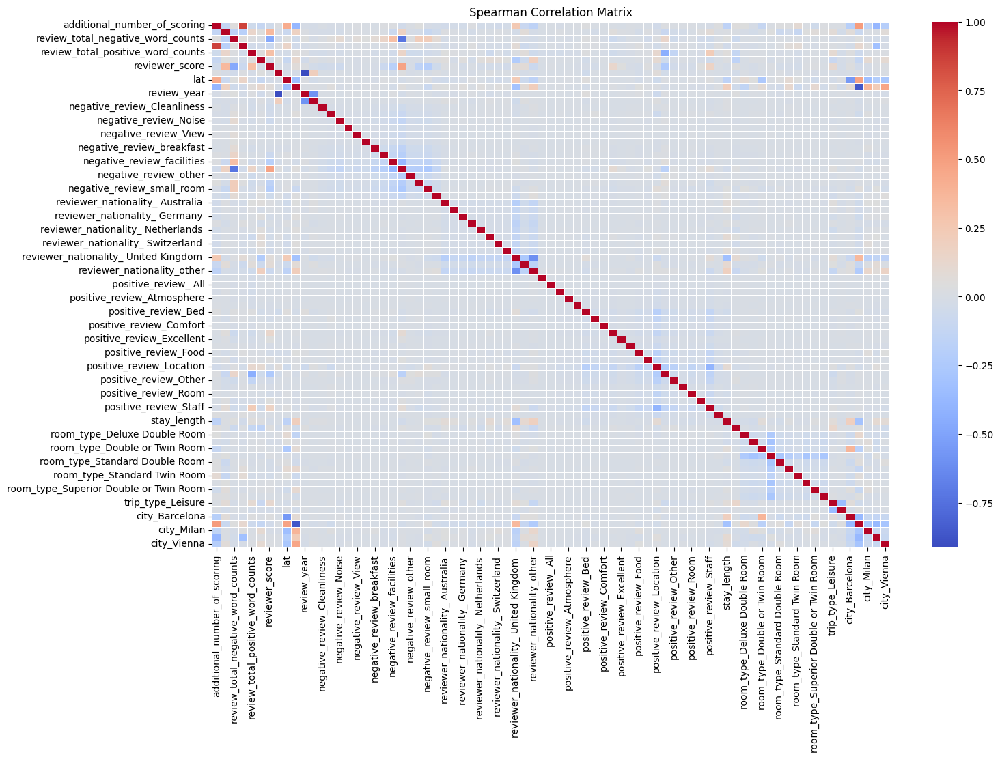

In [25]:

# # Выбираем числовые признаки для анализа корреляции
# numeric_features = hotels.select_dtypes(include=[np.number])
# # Устанавливаем порог для отображения значимых корреляций
# corr_threshold = 0.5

# # Строим корреляционную матрицу с использованием метода Spearman (можно заменить на Pearson или Kendall)
# corr_matrix = numeric_features.corr(method='spearman')

# # Отображаем корреляционную матрицу с помощью heatmap
# plt.figure(figsize=(16, 10))
# sns.heatmap(corr_matrix, cmap='coolwarm', linewidths=0.5)
# plt.title('Spearman Correlation Matrix')
# plt.show()

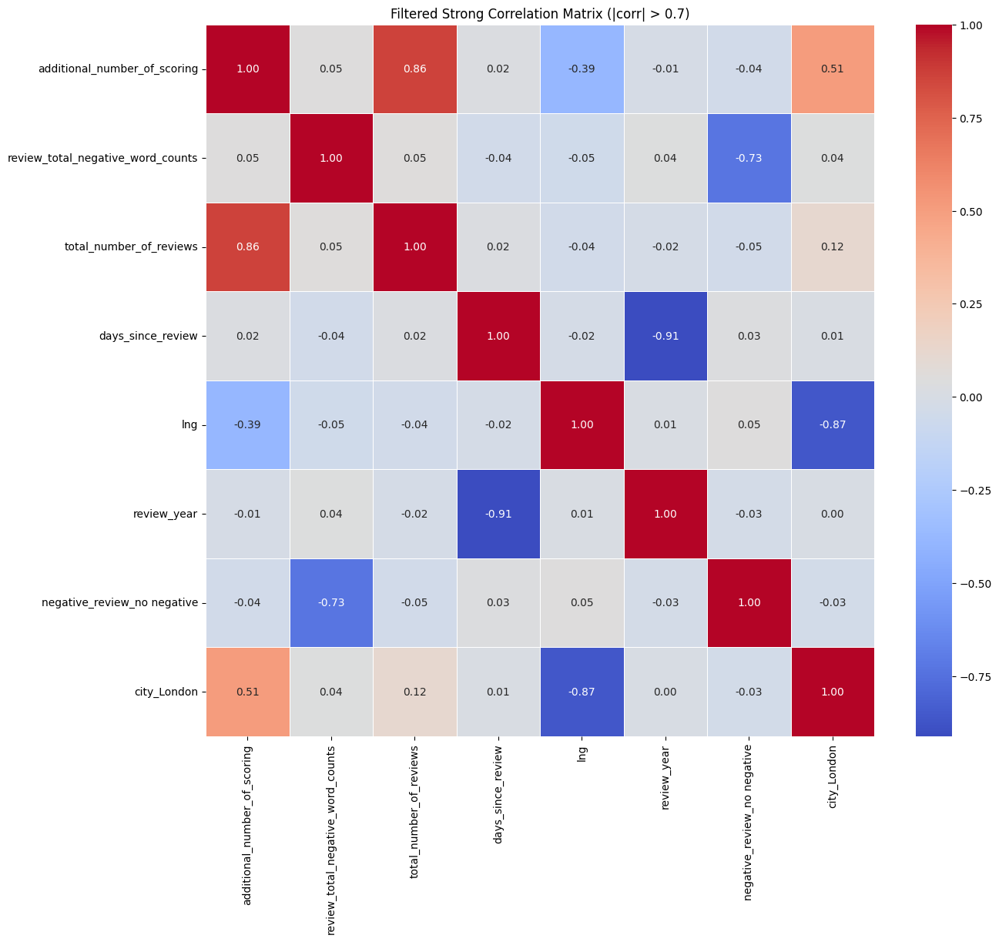

In [30]:

corr_matrix = hotels.corr(method='spearman')

# Установим порог корреляции (например, 0.7)
corr_threshold = 0.7

# Отбираем только корреляции, которые больше порога
strong_corr_matrix = corr_matrix[((corr_matrix >= corr_threshold) | (corr_matrix <= -corr_threshold)) & (corr_matrix != 1)]

# Получаем только те столбцы и строки, где есть хотя бы одна корреляция больше порога
cols_with_strong_corr = strong_corr_matrix.columns[strong_corr_matrix.notna().any()].tolist()
rows_with_strong_corr = strong_corr_matrix.index[strong_corr_matrix.notna().any()].tolist()

# Фильтруем исходную матрицу корреляций по этим столбцам и строкам
filtered_corr_matrix = corr_matrix.loc[rows_with_strong_corr, cols_with_strong_corr]

# Визуализируем только сильные корреляции
plt.figure(figsize=(14,12))
sns.heatmap(filtered_corr_matrix, annot=True, cmap='coolwarm', linewidths=0.5, mask=filtered_corr_matrix.isnull(), fmt='.2f')
plt.title('Filtered Strong Correlation Matrix (|corr| > 0.7)')
plt.show()

In [13]:
d = dtale.show(hotels)
d

c:\Python310\lib\site-packages\dtale\views.py:816: FutureWarning:

['stay_length'] did not aggregate successfully. If any error is raised this will raise in a future version of pandas. Drop these columns/ops to avoid this warning.



c:\Python310\lib\site-packages\dtale\views.py:2178: FutureWarning:

The default value of regex will change from True to False in a future version.



In [461]:
# убираем признаки которые еще не успели обработать, 
# модель на признаках с dtypes "object" обучаться не будет, просто выберим их и удалим
# object_columns = [s for s in hotels.columns if hotels[s].dtypes == 'object']
# hotels.drop(object_columns, axis = 1, inplace=True)

# заполняем пропуски самым простым способом
# hotels = hotels.fillna(0)

In [31]:
# Разбиваем датафрейм на части, необходимые для обучения и тестирования модели  
# Х - данные с информацией об отелях, у - целевая переменная (рейтинги отелей)  
X = hotels.drop(['reviewer_score'], axis = 1)  
y = hotels['reviewer_score'] 

In [32]:
# Загружаем специальный инструмент для разбивки:  
from sklearn.model_selection import train_test_split  

In [33]:
# Наборы данных с меткой "train" будут использоваться для обучения модели, "test" - для тестирования.  
# Для тестирования мы будем использовать 25% от исходного датасета.  
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [34]:
# Импортируем необходимые библиотеки:  
from sklearn.ensemble import RandomForestRegressor # инструмент для создания и обучения модели  
from sklearn import metrics # инструменты для оценки точности модели  
  
# Создаём модель  
regr = RandomForestRegressor(n_estimators=100)  
      
# Обучаем модель на тестовом наборе данных  
regr.fit(X_train, y_train)  
      
# Используем обученную модель для предсказания рейтинга отелей в тестовой выборке.  
# Предсказанные значения записываем в переменную y_pred  
y_pred = regr.predict(X_test)  


In [35]:
# Сравниваем предсказанные значения (y_pred) с реальными (y_test), и смотрим насколько они отличаются  
# Метрика называется Mean Absolute Percentage Error (MAPE) и показывает среднюю абсолютную процентную ошибку предсказанных значений от фактических.  
print('MAPE:', metrics.mean_absolute_percentage_error(y_test, y_pred))

MAPE: 0.12813629667139093


2024-10-21 12:19:19,722 - INFO     - Executing shutdown due to inactivity...
2024-10-21 12:19:19,750 - INFO     - Executing shutdown...
2024-10-21 12:19:19,755 - INFO     - Not running with the Werkzeug Server, exiting by searching gc for BaseWSGIServer


Небольшой бонус:


In [20]:
# # убираем признаки которые еще не успели обработать, 
# # модель на признаках с dtypes "object" обучаться не будет, просто выберим их и удалим
# object_columns = [s for s in hotels.columns if hotels[s].dtypes == 'object']
# hotels.drop(object_columns, axis = 1, inplace=True)

# # заполняем пропуски самым простым способом
# hotels = hotels.fillna(0)